In [4]:
!pwd
!pip install opencv-python

/content


In [219]:
import os
import cv2
import numpy as np

def remove_hair_old(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply blackhat filter
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    # Threshold to create hair mask
    _, thresh = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
    # Inpaint
    result = cv2.inpaint(image, thresh, 1, cv2.INPAINT_TELEA)
    return result


def remove_hair_harsh_1(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    # Apply blackhat filter
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (17,17))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, kernel)

    # Enhance hair visibility
    _, thresh = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

    # Remove small noise
    kernel_erode = np.ones((3,3), np.uint8)
    eroded = cv2.erode(thresh, kernel_erode, iterations=1)

    # Dilate to thicken hair mask
    kernel_dilate = np.ones((3,3), np.uint8)
    dilated = cv2.dilate(eroded, kernel_dilate, iterations=1)

    # Inpaint
    result = cv2.inpaint(image, dilated, 5, cv2.INPAINT_TELEA)

    return result


def remove_hair_balanced(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=1.75, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    # Apply blackhat filter with balanced kernel size
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13,13))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, kernel)

    # Threshold to create hair mask
    _, thresh = cv2.threshold(blackhat, 12, 255, cv2.THRESH_BINARY)

    # Remove small noise
    kernel_erode = np.ones((2,2), np.uint8)
    eroded = cv2.erode(thresh, kernel_erode, iterations=1)

    # Dilate to thicken hair mask
    kernel_dilate = np.ones((2,2), np.uint8)
    dilated = cv2.dilate(eroded, kernel_dilate, iterations=2)

    # Inpaint
    result = cv2.inpaint(image, dilated, 4, cv2.INPAINT_TELEA)

    return result

def remove_hair_moderate(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    # Apply blackhat filter with moderate kernel size
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,10))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, kernel)

    # Threshold to create hair mask
    _, thresh = cv2.threshold(blackhat, 15, 255, cv2.THRESH_BINARY)

    # Remove small noise with moderate erosion
    kernel_erode = np.ones((2,2), np.uint8)
    eroded = cv2.erode(thresh, kernel_erode, iterations=1)

    # Dilate to slightly thicken hair mask
    kernel_dilate = np.ones((2,2), np.uint8)
    dilated = cv2.dilate(eroded, kernel_dilate, iterations=1)

    # Inpaint with moderate radius
    result = cv2.inpaint(image, dilated, 3, cv2.INPAINT_TELEA)

    return result

import cv2
import numpy as np
import torch

def remove_hair_flexible_torch(image):
    # Check if the input is a torch tensor
    is_torch_tensor = isinstance(image, torch.Tensor)

    if is_torch_tensor:
        # Convert torch tensor to numpy array
        image_np = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        # Rescale from [0, 1] to [0, 255]
        image_np = (image_np * 255).astype(np.uint8)
    else:
        image_np = image

    # Convert to grayscale
    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)

    # Apply blackhat filter
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)

    # Threshold to create hair mask
    _, thresh = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

    # Inpaint
    result = cv2.inpaint(image_np, thresh, 1, cv2.INPAINT_TELEA)

    if is_torch_tensor:
        # Convert result back to torch tensor
        result_tensor = torch.from_numpy(result).permute(2, 0, 1).unsqueeze(0).float() / 255.0
        return result_tensor
    else:
        return result

def remove_hair_gentle(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a hair kernel
    hair_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9,1))

    # Use top-hat filter to detect dark, thin structures
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, hair_kernel)

    # Enhance contrast of the tophat result
    tophat = cv2.normalize(tophat, None, 0, 255, cv2.NORM_MINMAX)

    # Apply adaptive thresholding
    thresh = cv2.adaptiveThreshold(tophat, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY, 11, 2)

    # Clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    # Create a mask for inpainting
    mask = cv2.dilate(thresh, kernel, iterations=1)

    # Inpaint with a small radius
    result = cv2.inpaint(image, mask, 1, cv2.INPAINT_TELEA)

    return result


def conservative_hair_removal(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a thin, linear kernel for hair detection
    hair_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,1))

    # Use top-hat filter to detect dark, thin structures
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, hair_kernel)

    # Enhance contrast of the tophat result
    tophat = cv2.normalize(tophat, None, 0, 255, cv2.NORM_MINMAX)

    # Apply threshold to create hair mask
    _, thresh = cv2.threshold(tophat, 10, 255, cv2.THRESH_BINARY)

    # Remove small objects (noise) from the mask
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

    # Use erosion to thin the lines instead of thinning
    kernel = np.ones((3,3), np.uint8)
    thin_lines = cv2.erode(thresh, kernel, iterations=1)

    # Dilate the thin lines slightly
    hair_mask = cv2.dilate(thin_lines, np.ones((3,1), np.uint8), iterations=1)

    # Inpaint only the detected hair regions
    result = cv2.inpaint(image, hair_mask, 1, cv2.INPAINT_TELEA)

    return result

def remove_hair_from_directory(image_directory, processed_directory):
    for filename in os.listdir(image_directory):
        if filename.endswith((".png", ".jpg", ".jpeg", ".gif")):
            image_path = os.path.join(image_directory, filename)
            image = cv2.imread(image_path)
            hair_removed = remove_hair_old(image)
            #hair_removed = remove_hair_balanced(image)
            cv2.imwrite(f"{processed_directory}/{filename}", hair_removed)

In [119]:
image_path = os.path.join("/content/original/mel", "ISIC_0024630.jpg")
image_path = os.path.join("/content/original/nv", "ISIC_0024474.jpg")

image = cv2.imread(image_path)
hair_removed = remove_hair_old(image)
cv2.imwrite("/content/hair_removed_image.jpg", hair_removed)

True

In [120]:
!pwd

/content/GroundingDINO


In [220]:
import os

src_dir = "/content/original"
dst_dir = "/content/hair_removed"

# List all folders in the source directory
folders = [os.path.relpath(os.path.join(root, d), src_dir) for root, dirs, files in os.walk(src_dir) for d in dirs]

print("Folders in source directory:")
for folder in folders:
    print(folder)
    # Create the same folder in the destination directory
    os.makedirs(os.path.join(dst_dir, folder), exist_ok=True)
    print(f"destination folder {folder} created and now hair removal in progress")
    remove_hair_from_directory(os.path.join(src_dir, folder), os.path.join(dst_dir, folder))

print(f"\nFolder structure created in {dst_dir} and populated with hair removed images")

Folders in source directory:
bcc
destination folder bcc created and now hair removal in progress
bkl
destination folder bkl created and now hair removal in progress
mel
destination folder mel created and now hair removal in progress
nv
destination folder nv created and now hair removal in progress
akiec
destination folder akiec created and now hair removal in progress
df
destination folder df created and now hair removal in progress
vasc
destination folder vasc created and now hair removal in progress

Folder structure created in /content/hair_removed and populated with hair removed images


In [9]:
!nvidia-smi

Sun Dec  8 22:29:38 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [10]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [11]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 463 (delta 176), reused 137 (delta 137), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 11.22 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 23.2 MB/s eta 0:00:00


In [12]:
import os

CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [13]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [14]:
import os

WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


In [15]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import load_model, load_image, predict, annotate

grounding_dino_model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/content/GroundingDINO


final text_encoder_type: bert-base-uncased


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tensor([[0.4995, 0.5000, 0.9928, 0.9926],
        [0.6068, 0.6757, 0.1627, 0.6425]])
tensor([0.3744, 0.3668])
['lesion', 'lesion']
selected_box
tensor([0.6068, 0.6757, 0.1627, 0.6425])
selected_box_coords
[315.27582 159.52245 412.8741  448.63513]
image_height, image_width
450 600


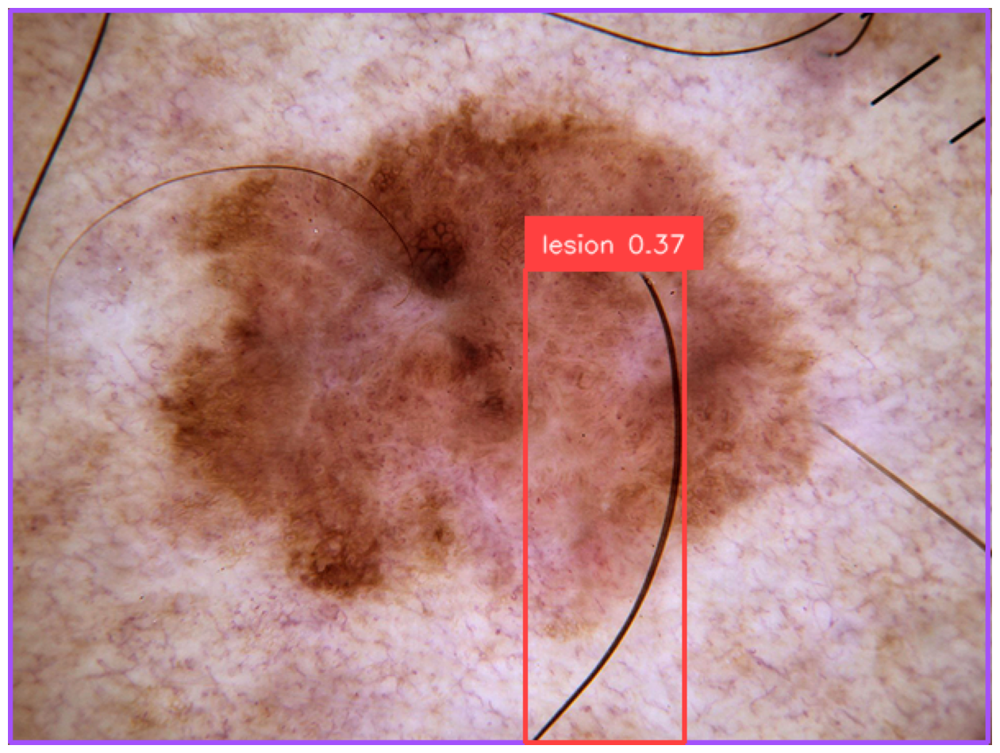

In [16]:
import os
import supervision as sv
import numpy as np

IMAGE_NAME = "/content/original/mel/ISIC_0024630.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

TEXT_PROMPT = "lesion"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=grounding_dino_model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)
print(boxes)
print(logits)
print(phrases)
image_height, image_width = image_source.shape[:2]

areas = boxes[:,2] * boxes[:,3]
smallest_index = np.argmin(areas)
selected_box = boxes[smallest_index]
print("selected_box")
print(selected_box)
selected_box_coords = np.zeros_like(selected_box)
# Calculate top-left and bottom-right pixel coordinates
selected_box_coords[0] = (selected_box[0] - selected_box[2]/2)*image_width
selected_box_coords[1] = (selected_box[1] - selected_box[3]/2)*image_height
selected_box_coords[2] = (selected_box[0] + selected_box[2]/2)*image_width
selected_box_coords[3] = (selected_box[1] + selected_box[3]/2)*image_height
print("selected_box_coords")
print(selected_box_coords)

'''
pixel_boxes_new = np.zeros_like(pixel_boxes)
# Calculate top-left and bottom-right pixel coordinates
pixel_boxes_new[:,0] = pixel_boxes[:,0] - pixel_boxes[:,2]/2
pixel_boxes_new[:,1] = pixel_boxes[:,1] - pixel_boxes[:,3]/2
pixel_boxes_new[:,2] = pixel_boxes[:,0] + pixel_boxes[:,2]/2
pixel_boxes_new[:,3] = pixel_boxes[:,1] + pixel_boxes[:,3]/2
print(pixel_boxes_new)
print(pixel_boxes_new[smallest_index])
'''


print("image_height, image_width")
print(image_height, image_width)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

In [17]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install supervision
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-w1j54ab3
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-w1j54ab3
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=868fb6f0e1c7b8d3528212bf6f14e2d6f4b3b502e57935b0e19c6929f0150c89
  Stored in directory: /tmp/pip-ephem-wheel-cache-gf8mim8d/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment_anything


In [18]:
#from segment_anything import sam_model_registry
# Initialize SAM model
import torch
import cv2
import supervision as sv
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
MODEL_TYPE = ["vit_h","vit_l","vit_b"]
CHECKPOINT_PATH =["./sam_vit_h_4b8939.pth","sam_vit_l_0b3195.pth","sam_vit_b_01ec64.pth"]

model = "vit_b"
if model =='vit_h':
  CHECKPOINT_PATH = f"./sam_{model}_4b8939.pth"
elif model =='vit_l':
  CHECKPOINT_PATH = f"./sam_{model}_0b3195.pth"
else:
  CHECKPOINT_PATH = f"./sam_{model}_01ec64.pth"

sam = sam_model_registry[model](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

cuda:0


In [19]:
model = "vit_b"
CHECKPOINT_PATH_TUNED = "/content/sam_vit_b_01ec64_ham10000_fine_tuned_sam.pth"

sam_tuned = sam_model_registry[model](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)
print(sam_tuned.image_encoder.img_size)

1024


In [20]:
from scipy.ndimage import label
import matplotlib.pyplot as plt

def retain_largest_connected_region(mask):
    # Label connected regions in the mask
    labeled_mask, num_features = label(mask)
    if num_features == 0:
        return mask  # Return the original mask if no connected regions are found

    # Find the largest connected component
    largest_component = max(range(1, num_features + 1), key=lambda x: np.sum(labeled_mask == x))

    # Create a binary mask for the largest connected component
    largest_connected_region = (labeled_mask == largest_component)
    return largest_connected_region

[315.27582 159.52245 728.1499  608.1576 ]
masks shape: (3, 450, 600)
(450, 600)
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


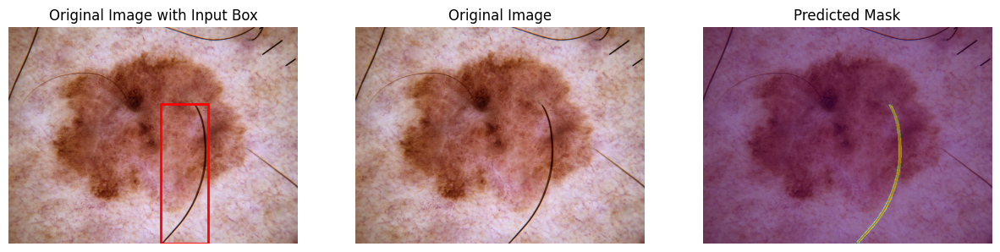

In [21]:
import torch
import numpy as np
from pycocotools.coco import COCO
from PIL import Image
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
import random
from matplotlib.patches import Rectangle


image_path = "/content/original/mel/ISIC_0024630.jpg"
image = np.array(Image.open(image_path).convert("RGB"))

predictor = SamPredictor(sam)
#predictor = SamPredictor(sam)

# Set the image in the predictor
predictor.set_image(image)

bbox = selected_box_coords
input_box = np.array([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])
print(input_box)
#input_box = np.array([203.61, 58.19, 377.91, 254.21])
input_label = "lesion"
input_box=np.array(selected_box_coords)

masks, _, _ = predictor.predict(
  point_coords=None,
  point_labels=None,
  #box=None,
  box=input_box,
  multimask_output=True,
)
print("masks shape:", masks.shape)

# Find the largest mask
largest_mask = masks[np.argmax([np.sum(mask) for mask in masks])]
largest_mask = retain_largest_connected_region(largest_mask)
print(largest_mask.shape)
print(largest_mask)
plt.figure(figsize=(15, 5))

# Original Image with Input Box
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original Image with Input Box")
plt.axis('off')

# Draw the input box
rect = Rectangle((input_box[0], input_box[1]),
                 input_box[2] - input_box[0],
                 input_box[3] - input_box[1],
                 linewidth=2, edgecolor='r', facecolor='none')
plt.gca().add_patch(rect)

plt.subplot(1, 3, 2)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(image)
#plt.imshow(masks[0], alpha=0.5)
plt.imshow(largest_mask, alpha=0.5)  # Overlay the largest predicted mask
plt.title(f"Predicted Mask")
plt.axis('off')
plt.show()

In [22]:
!pwd

/content/GroundingDINO


In [23]:
!cd /content/
!pwd

/content/GroundingDINO


In [242]:
import os
import supervision as sv
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor
from matplotlib.patches import Rectangle
from scipy.ndimage import binary_dilation

def extract_lesion_from_image_and_save(hair_removed_image_path, original_image_path, path_to_save_file, show_plots=True, print_logs=True):
    # Constants
    TEXT_PROMPT = "lesion"
    BOX_THRESHOLD = 0.2
    TEXT_THRESHOLD = 0.2
    if print_logs:
      print("image_path_for_dino")
      print(hair_removed_image_path)
      print("image_path_for_sam")
      print(original_image_path)
      print(TEXT_PROMPT)

    # Load image
    image_source, image = load_image(hair_removed_image_path)
    image_height, image_width = image_source.shape[:2]

    # Predict boxes
    boxes, logits, phrases = predict(
        model=grounding_dino_model,
        image=image,
        caption=TEXT_PROMPT,
        box_threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD
    )
    # Annotate frame
    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

    if show_plots:
        sv.plot_image(annotated_frame, (4, 4))

    # Calculate box areas
    areas = boxes[:, 2] * boxes[:, 3]
    width_height_ratio = boxes[:, 2] / boxes[:, 3]
    if print_logs:
        print("-----------------------")
        print("initial detected boxes")
        print(boxes)
        print("-----------------------")
        print("initial logits")
        print(logits)
        print("-----------------------")
        print("initial areas")
        print(areas)
        print("-----------------------")
        print("initial width_height_ratio")
        print(width_height_ratio)

    # Find indices of areas greater than 0.95
    #indices_to_remove = np.where((areas > 0.81) | (areas < 0.04) | (width_height_ratio<0.25) | (width_height_ratio>3.5) )[0]
    # Find indices to remove based on the specified conditions
    indices_to_remove = np.where(
        (boxes[:,0]+boxes[:,2]/2 > 0.98) & (boxes[:,2]/2 < 0.4) & (boxes[:,3]/2 < 0.4) |
        (boxes[:,0]-boxes[:,2]/2 < 0.02) & (boxes[:,2]/2 < 0.4) & (boxes[:,3]/2 < 0.4) |
        (boxes[:,1]+boxes[:,3]/2 > 0.98) & (boxes[:,2]/2 < 0.4) & (boxes[:,3]/2 < 0.4) |
        (boxes[:,1]-boxes[:,3]/2 < 0.02) & (boxes[:,2]/2 < 0.4) & (boxes[:,3]/2 < 0.4) |
        (areas > 0.94) |
        (areas < 0.02) |
        ((areas < 0.08) & (logits < 0.3)) |
        ((areas > 0.85) & (logits < 0.2)) |
        (((width_height_ratio < 0.32) | (width_height_ratio > 3.2)) & (logits < 0.25))
    )[0]
    if print_logs:
      print("indices_to_remove")
      print(indices_to_remove)
    # Remove the corresponding boxes based on the found indices
    boxes = np.delete(boxes, indices_to_remove, axis=0)
    areas = np.delete(areas, indices_to_remove)
    logits = np.delete(logits, indices_to_remove)
    phrases = np.delete(phrases, indices_to_remove)
    width_height_ratio = np.delete(width_height_ratio, indices_to_remove)

    if print_logs:
        print("-----------------------")
        print("filtered boxes")
        print(boxes)
        print("-----------------------")
        print("filtered areas")
        print(areas)
        print("-----------------------")
        print("filtered logits")
        print(logits)
        print("-----------------------")
        print("filtered phrases")
        print(phrases)
        print("-----------------------")
        print("filtered width_height_ratio")
        print(width_height_ratio)
    if len(boxes) == 0:
       selected_box_coords = np.array([ 50 , 50, 500, 400])
    else:
      if len(boxes) == 1:
        lesion_box_index=0
      else:
          lesion_box_index=np.argmax(areas)
      selected_box = boxes[lesion_box_index]

      if print_logs:
          print(selected_box)

      # Calculate box coordinates
      selected_box_coords = np.zeros_like(selected_box)
      selected_box_coords[0] = (selected_box[0] - selected_box[2]/2) * image_width
      selected_box_coords[1] = (selected_box[1] - selected_box[3]/2) * image_height
      selected_box_coords[2] = (selected_box[0] + selected_box[2]/2) * image_width
      selected_box_coords[3] = (selected_box[1] + selected_box[3]/2) * image_height

    if print_logs:
        print("selected_box_coords")
        print(selected_box_coords)

    # Annotate frame
    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

    if show_plots:
        sv.plot_image(annotated_frame, (4, 4))

    # SAM prediction
    predictor = SamPredictor(sam)
    #predictor = SamPredictor(sam_tuned)
    predictor.set_image(np.array(Image.open(hair_removed_image_path).convert("RGB")))

    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=(selected_box_coords),
        multimask_output=True,
    )

    mask_areas = [np.sum(mask) for mask in masks]
    if print_logs:
        print("mask_areas")
        print(mask_areas)
    if(max(mask_areas)<6000):
      masks, _, _ = predictor.predict(
          point_coords=None,
          point_labels=None,
          box=(np.array([50, 50, 450, 350])),
          multimask_output=True,
      )

    # Find largest mask
    largest_mask = masks[np.argmax([np.sum(mask) for mask in masks])]
    largest_mask = retain_largest_connected_region(largest_mask)


    # Create binary mask
    binary_mask = (largest_mask > 0).astype(np.uint8) * 255

    # Extend the binary mask by 5 pixels in all directions
    # We define a kernel for dilation. The kernel size is (11, 11) because we want to extend by 5 pixels in each direction, so 5 + 1 + 5 = 11.
    kernel = np.ones((9, 9), np.uint8)  # 11x11 kernel for 5 pixels in each direction
    extended_mask = binary_dilation(binary_mask, structure=kernel).astype(np.uint8)

    # If you need the mask as 255 for white pixels
    extended_mask_255 = extended_mask * 255

    # Apply morphological closing to make sure no holes in detected segments
    kernel_size = 100  # Adjust this value based on the size of gaps you want to close
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    closed_mask = cv2.morphologyEx(extended_mask_255, cv2.MORPH_CLOSE, kernel)

    # Optional: Apply Gaussian blur for smoother edges
    closed_mask = cv2.GaussianBlur(closed_mask, (5, 5), 0)

    original_image = Image.open(original_image_path).convert("RGB")
    # Apply mask to original image
    #masked_image_array = image_source * (closed_mask[:, :, None] // 255)
    masked_image_array = original_image * (closed_mask[:, :, None] // 255)

    # Convert to PIL Image and save
    masked_image = Image.fromarray(masked_image_array.astype(np.uint8))
    masked_image.save(path_to_save_file)

    if print_logs:
        print(f"Masked portion of the image saved as '{path_to_save_file}'")

    if show_plots:
        # Plotting
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(10, 4))

        #ax1.imshow(image_source)
        ax1.imshow(original_image)
        ax1.add_patch(Rectangle((selected_box_coords[0], selected_box_coords[1]),
                                selected_box_coords[2] - selected_box_coords[0],
                                selected_box_coords[3] - selected_box_coords[1],
                                linewidth=2, edgecolor='r', facecolor='none'))
        ax1.set_title("Original Image with Input Box")
        ax1.axis('off')

        #ax2.imshow(image_source)
        ax2.imshow(original_image)
        ax2.set_title("Original Image")
        ax2.axis('off')

        #ax3.imshow(image_source)
        ax3.imshow(original_image)
        ax3.imshow(closed_mask, alpha=0.5)
        ax3.set_title("Predicted Mask")
        ax3.axis('off')

        #ax4.imshow(image_source)
        ax4.imshow(masked_image)
        ax4.set_title("Masked Image")
        ax4.axis('off')

        plt.show()


def test(hair_removed_image_path, original_image_path):
  #image_path = "/content/original/nv/ISIC_0024474.jpg"

  extract_lesion_from_image_and_save(hair_removed_image_path, original_image_path , f"/content/masked_image_{img.replace('/', '_')}", show_plots=True, print_logs=True)
  '''
  image = cv2.imread(image_path)
  hair_removed = remove_hair_old(image)
  cv2.imwrite("/content/hair_removed_image.jpg", hair_removed)
  # Usage example:
  extract_lesion_from_image_and_save("/content/hair_removed_image.jpg", "/content/hair_masked_image.png", show_plots=True, print_logs=True)
  '''


image_path_for_dino
/content/hair_removed/bkl/ISIC_0031485.jpg
image_path_for_sam
/content/original/bkl/ISIC_0031485.jpg
lesion


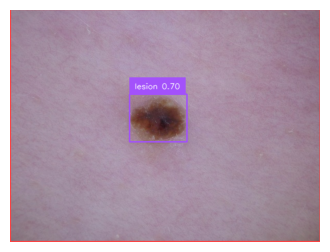

-----------------------
initial detected boxes
tensor([[0.4781, 0.4684, 0.1857, 0.2044],
        [0.5001, 0.4999, 1.0000, 0.9993]])
-----------------------
initial logits
tensor([0.6995, 0.2692])
-----------------------
initial areas
tensor([0.0380, 0.9993])
-----------------------
initial width_height_ratio
tensor([0.9088, 1.0006])
indices_to_remove
[1]
-----------------------
filtered boxes
tensor([[0.4781, 0.4684, 0.1857, 0.2044]])
-----------------------
filtered areas
tensor([0.0380])
-----------------------
filtered logits
tensor([0.6995])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.9088])
tensor([0.4781, 0.4684, 0.1857, 0.2044])
selected_box_coords
[231.13432 164.81512 342.57803 256.78662]


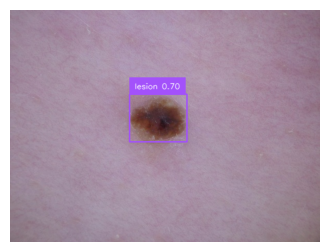

mask_areas
[7166, 6898, 6390]
Masked portion of the image saved as '/content/masked_image_bkl_ISIC_0031485.jpg'


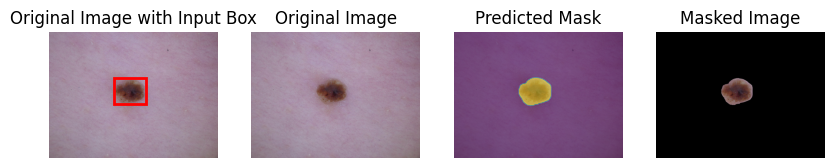

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029715.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029715.jpg
lesion


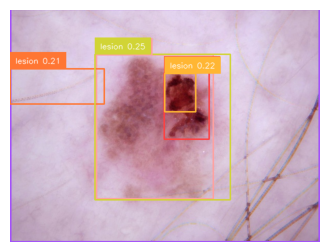

-----------------------
initial detected boxes
tensor([[0.4998, 0.5000, 0.9960, 0.9964],
        [0.5701, 0.4168, 0.1449, 0.2863],
        [0.4679, 0.5062, 0.3773, 0.6187],
        [0.1520, 0.3320, 0.3030, 0.1519],
        [0.5498, 0.3589, 0.1000, 0.1659],
        [0.4921, 0.5071, 0.4359, 0.6234]])
-----------------------
initial logits
tensor([0.3482, 0.4264, 0.3073, 0.2141, 0.2217, 0.2478])
-----------------------
initial areas
tensor([0.9924, 0.0415, 0.2334, 0.0460, 0.0166, 0.2717])
-----------------------
initial width_height_ratio
tensor([0.9996, 0.5059, 0.6098, 1.9946, 0.6031, 0.6993])
indices_to_remove
[0 3 4]
-----------------------
filtered boxes
tensor([[0.5701, 0.4168, 0.1449, 0.2863],
        [0.4679, 0.5062, 0.3773, 0.6187],
        [0.4921, 0.5071, 0.4359, 0.6234]])
-----------------------
filtered areas
tensor([0.0415, 0.2334, 0.2717])
-----------------------
filtered logits
tensor([0.4264, 0.3073, 0.2478])
-----------------------
filtered phrases
['lesion' 'lesion' 'les

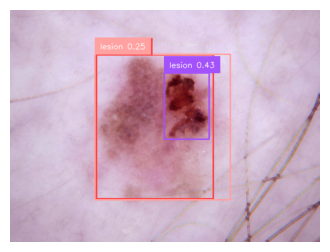

mask_areas
[50661, 42464, 39613]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029715.jpg'


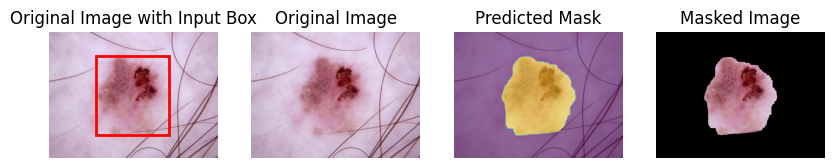

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029827.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029827.jpg
lesion


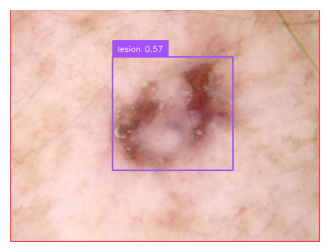

-----------------------
initial detected boxes
tensor([[0.5247, 0.4493, 0.3878, 0.4872],
        [0.5000, 0.4999, 1.0000, 0.9996]])
-----------------------
initial logits
tensor([0.5662, 0.3949])
-----------------------
initial areas
tensor([0.1889, 0.9996])
-----------------------
initial width_height_ratio
tensor([0.7960, 1.0004])
indices_to_remove
[1]
-----------------------
filtered boxes
tensor([[0.5247, 0.4493, 0.3878, 0.4872]])
-----------------------
filtered areas
tensor([0.1889])
-----------------------
filtered logits
tensor([0.5662])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.7960])
tensor([0.5247, 0.4493, 0.3878, 0.4872])
selected_box_coords
[198.50612  92.58179 431.17267 311.80698]


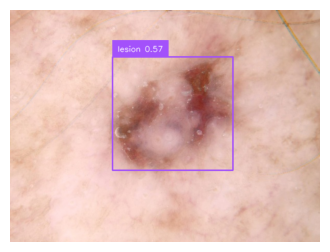

mask_areas
[27304, 25040, 21594]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029827.jpg'


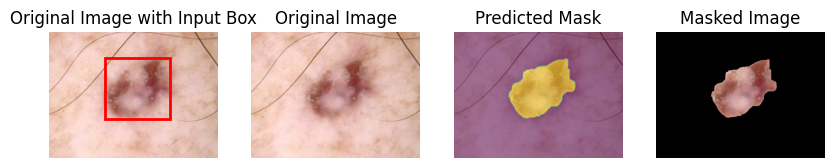

image_path_for_dino
/content/hair_removed/akiec/ISIC_0024511.jpg
image_path_for_sam
/content/original/akiec/ISIC_0024511.jpg
lesion


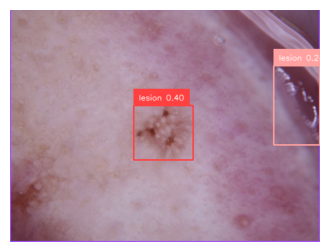

-----------------------
initial detected boxes
tensor([[0.5000, 0.5000, 1.0000, 0.9995],
        [0.4951, 0.5312, 0.1913, 0.2337],
        [0.9256, 0.4124, 0.1486, 0.3397]])
-----------------------
initial logits
tensor([0.5008, 0.3967, 0.2381])
-----------------------
initial areas
tensor([0.9995, 0.0447, 0.0505])
-----------------------
initial width_height_ratio
tensor([1.0005, 0.8186, 0.4374])
indices_to_remove
[0 2]
-----------------------
filtered boxes
tensor([[0.4951, 0.5312, 0.1913, 0.2337]])
-----------------------
filtered areas
tensor([0.0447])
-----------------------
filtered logits
tensor([0.3967])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.8186])
tensor([0.4951, 0.5312, 0.1913, 0.2337])
selected_box_coords
[239.6387  186.447   354.44858 291.6331 ]


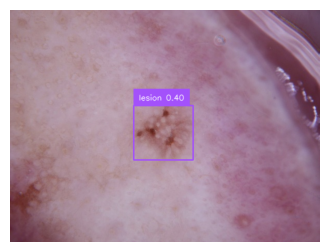

mask_areas
[7139, 6022, 5109]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0024511.jpg'


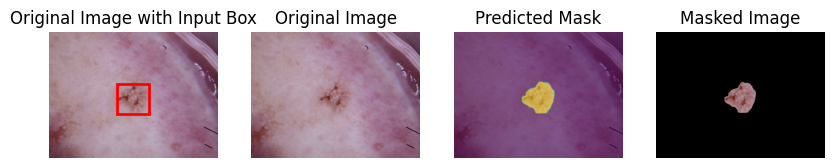

image_path_for_dino
/content/hair_removed/akiec/ISIC_0024948.jpg
image_path_for_sam
/content/original/akiec/ISIC_0024948.jpg
lesion


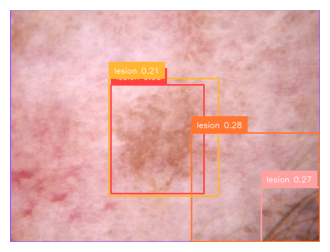

-----------------------
initial detected boxes
tensor([[0.5000, 0.5001, 1.0000, 1.0000],
        [0.4756, 0.5590, 0.3004, 0.4661],
        [0.9054, 0.8823, 0.1892, 0.2354],
        [0.7932, 0.7663, 0.4131, 0.4672],
        [0.4960, 0.5509, 0.3536, 0.5029]])
-----------------------
initial logits
tensor([0.5509, 0.3540, 0.2724, 0.2815, 0.2067])
-----------------------
initial areas
tensor([1.0000, 0.1400, 0.0445, 0.1930, 0.1778])
-----------------------
initial width_height_ratio
tensor([1.0000, 0.6446, 0.8034, 0.8842, 0.7031])
indices_to_remove
[0 2 3]
-----------------------
filtered boxes
tensor([[0.4756, 0.5590, 0.3004, 0.4661],
        [0.4960, 0.5509, 0.3536, 0.5029]])
-----------------------
filtered areas
tensor([0.1400, 0.1778])
-----------------------
filtered logits
tensor([0.3540, 0.2067])
-----------------------
filtered phrases
['lesion' 'lesion']
-----------------------
filtered width_height_ratio
tensor([0.6446, 0.7031])
tensor([0.4960, 0.5509, 0.3536, 0.5029])
selected_

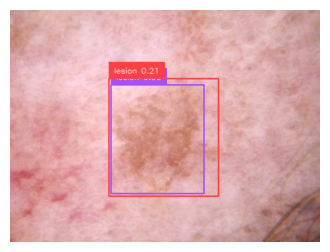

mask_areas
[25804, 22708, 21209]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0024948.jpg'


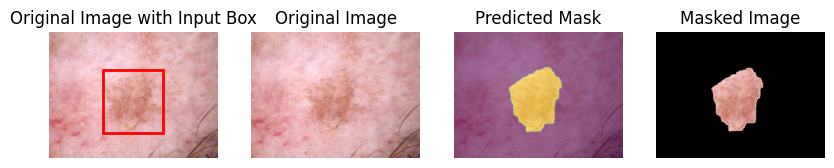

image_path_for_dino
/content/hair_removed/akiec/ISIC_0025637.jpg
image_path_for_sam
/content/original/akiec/ISIC_0025637.jpg
lesion


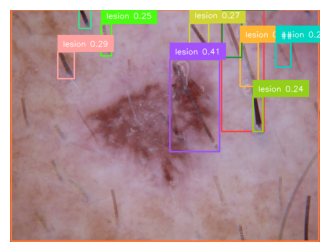

-----------------------
initial detected boxes
tensor([[0.5961, 0.4144, 0.1593, 0.3942],
        [0.7509, 0.2661, 0.1355, 0.5201],
        [0.1807, 0.2407, 0.0533, 0.1152],
        [0.4999, 0.4997, 0.9925, 0.9942],
        [0.7719, 0.2381, 0.0578, 0.1886],
        [0.6098, 0.1146, 0.0607, 0.1084],
        [0.3109, 0.1323, 0.0321, 0.1368],
        [0.8000, 0.4511, 0.0324, 0.1476],
        [0.2411, 0.0414, 0.0379, 0.0824],
        [0.7159, 0.1067, 0.0648, 0.2017],
        [0.8821, 0.1959, 0.0482, 0.1066]])
-----------------------
initial logits
tensor([0.4057, 0.2541, 0.2930, 0.2808, 0.2435, 0.2699, 0.2512, 0.2412, 0.2111,
        0.2475, 0.2029])
-----------------------
initial areas
tensor([0.0628, 0.0705, 0.0061, 0.9867, 0.0109, 0.0066, 0.0044, 0.0048, 0.0031,
        0.0131, 0.0051])
-----------------------
initial width_height_ratio
tensor([0.4041, 0.2605, 0.4628, 0.9983, 0.3066, 0.5600, 0.2347, 0.2197, 0.4596,
        0.3212, 0.4520])
indices_to_remove
[ 1  2  3  4  5  6  7  8  9 1

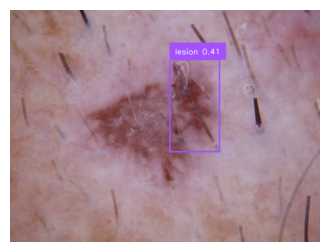

mask_areas
[3065, 2003, 1788]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0025637.jpg'


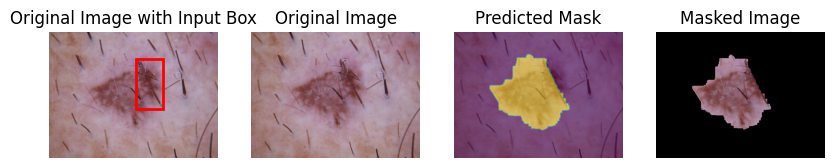

image_path_for_dino
/content/hair_removed/akiec/ISIC_0025811.jpg
image_path_for_sam
/content/original/akiec/ISIC_0025811.jpg
lesion


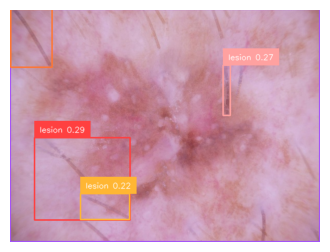

-----------------------
initial detected boxes
tensor([[0.4998, 0.5000, 0.9979, 0.9983],
        [0.2327, 0.7290, 0.3086, 0.3525],
        [0.6992, 0.3489, 0.0239, 0.2177],
        [0.0695, 0.1245, 0.1333, 0.2491],
        [0.3070, 0.8480, 0.1584, 0.1096]])
-----------------------
initial logits
tensor([0.4686, 0.2917, 0.2720, 0.2475, 0.2188])
-----------------------
initial areas
tensor([0.9962, 0.1088, 0.0052, 0.0332, 0.0174])
-----------------------
initial width_height_ratio
tensor([0.9996, 0.8755, 0.1097, 0.5352, 1.4454])
indices_to_remove
[0 2 3 4]
-----------------------
filtered boxes
tensor([[0.2327, 0.7290, 0.3086, 0.3525]])
-----------------------
filtered areas
tensor([0.1088])
-----------------------
filtered logits
tensor([0.2917])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.8755])
tensor([0.2327, 0.7290, 0.3086, 0.3525])
selected_box_coords
[ 47.069084 248.74141  232.2151   407.34415 ]


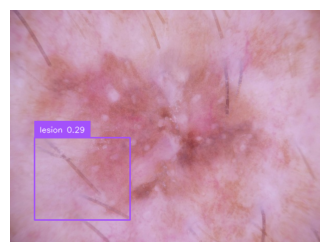

mask_areas
[2908, 2108, 1815]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0025811.jpg'


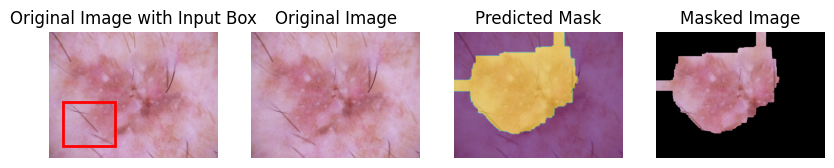

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029573.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029573.jpg
lesion


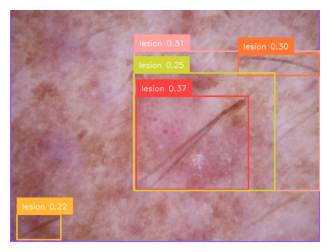

-----------------------
initial detected boxes
tensor([[0.4999, 0.5000, 0.9999, 0.9984],
        [0.5887, 0.5739, 0.3612, 0.3997],
        [0.6997, 0.4801, 0.5983, 0.5996],
        [0.8682, 0.2401, 0.2632, 0.0927],
        [0.0936, 0.9362, 0.1412, 0.1081],
        [0.6265, 0.5270, 0.4548, 0.5035]])
-----------------------
initial logits
tensor([0.3617, 0.3729, 0.3137, 0.2964, 0.2229, 0.2525])
-----------------------
initial areas
tensor([0.9983, 0.1444, 0.3587, 0.0244, 0.0153, 0.2290])
-----------------------
initial width_height_ratio
tensor([1.0015, 0.9036, 0.9977, 2.8407, 1.3064, 0.9032])
indices_to_remove
[0 2 3 4]
-----------------------
filtered boxes
tensor([[0.5887, 0.5739, 0.3612, 0.3997],
        [0.6265, 0.5270, 0.4548, 0.5035]])
-----------------------
filtered areas
tensor([0.1444, 0.2290])
-----------------------
filtered logits
tensor([0.3729, 0.2525])
-----------------------
filtered phrases
['lesion' 'lesion']
-----------------------
filtered width_height_ratio
tensor(

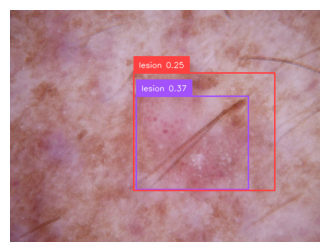

mask_areas
[5930, 4420, 3841]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029573.jpg'


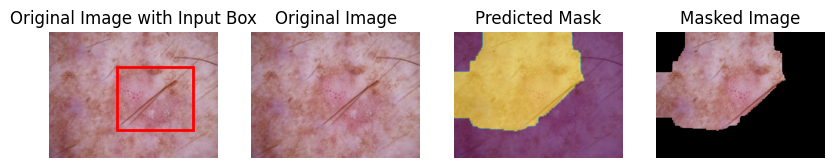

image_path_for_dino
/content/hair_removed/akiec/ISIC_0030463.jpg
image_path_for_sam
/content/original/akiec/ISIC_0030463.jpg
lesion


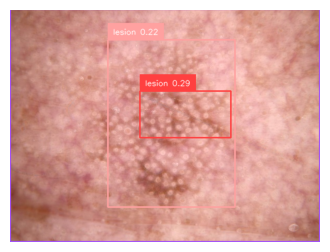

-----------------------
initial detected boxes
tensor([[0.4998, 0.4997, 0.9994, 0.9982],
        [0.5656, 0.4522, 0.2946, 0.2009],
        [0.5209, 0.4913, 0.4107, 0.7190]])
-----------------------
initial logits
tensor([0.5707, 0.2928, 0.2182])
-----------------------
initial areas
tensor([0.9975, 0.0592, 0.2953])
-----------------------
initial width_height_ratio
tensor([1.0012, 1.4663, 0.5711])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([[0.5209, 0.4913, 0.4107, 0.7190]])
-----------------------
filtered areas
tensor([0.2953])
-----------------------
filtered logits
tensor([0.2182])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.5711])
tensor([0.5209, 0.4913, 0.4107, 0.7190])
selected_box_coords
[189.35538   59.318127 435.75812  382.88162 ]


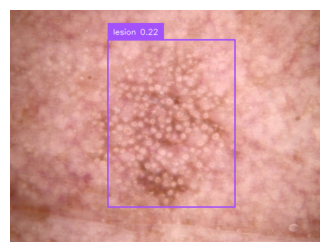

mask_areas
[77443, 53787, 28775]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0030463.jpg'


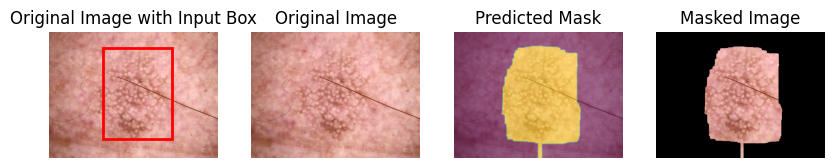

image_path_for_dino
/content/hair_removed/akiec/ISIC_0031918.jpg
image_path_for_sam
/content/original/akiec/ISIC_0031918.jpg
lesion


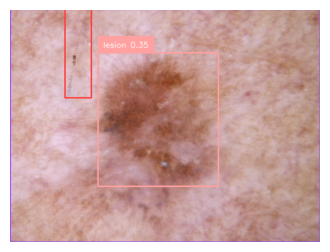

-----------------------
initial detected boxes
tensor([[0.5000, 0.5001, 1.0000, 1.0000],
        [0.2199, 0.1907, 0.0853, 0.3815],
        [0.4789, 0.4746, 0.3888, 0.5717]])
-----------------------
initial logits
tensor([0.4425, 0.3732, 0.3531])
-----------------------
initial areas
tensor([0.9999, 0.0325, 0.2223])
-----------------------
initial width_height_ratio
tensor([1.0000, 0.2235, 0.6800])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([[0.4789, 0.4746, 0.3888, 0.5717]])
-----------------------
filtered areas
tensor([0.2223])
-----------------------
filtered logits
tensor([0.3531])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.6800])
tensor([0.4789, 0.4746, 0.3888, 0.5717])
selected_box_coords
[170.69824  84.94859 403.971   342.22775]


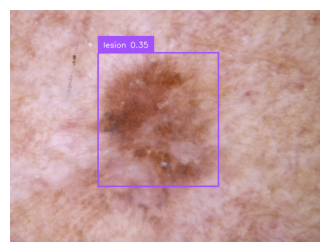

mask_areas
[36053, 30061, 21869]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0031918.jpg'


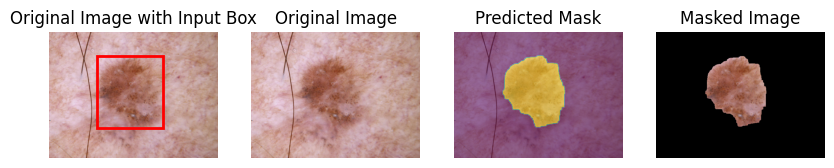

image_path_for_dino
/content/hair_removed/akiec/ISIC_0026522.jpg
image_path_for_sam
/content/original/akiec/ISIC_0026522.jpg
lesion


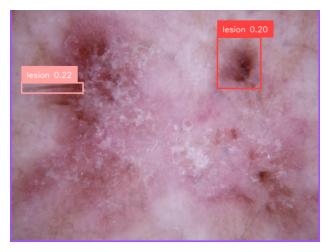

-----------------------
initial detected boxes
tensor([[0.5001, 0.4999, 0.9948, 0.9955],
        [0.7391, 0.2303, 0.1402, 0.2204],
        [0.1363, 0.3389, 0.1993, 0.0424]])
-----------------------
initial logits
tensor([0.5241, 0.2043, 0.2231])
-----------------------
initial areas
tensor([0.9903, 0.0309, 0.0084])
-----------------------
initial width_height_ratio
tensor([0.9994, 0.6363, 4.7014])
indices_to_remove
[0 1 2]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


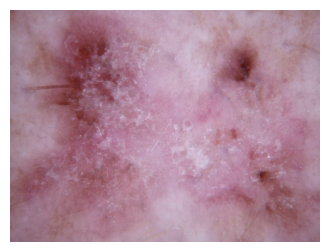

mask_areas
[146084, 94167, 14934]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0026522.jpg'


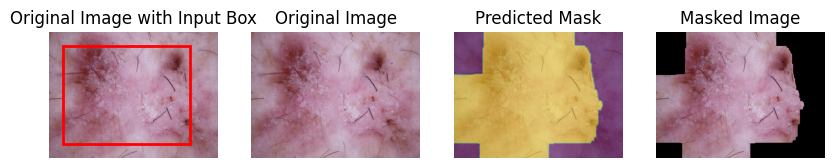

image_path_for_dino
/content/hair_removed/akiec/ISIC_0026848.jpg
image_path_for_sam
/content/original/akiec/ISIC_0026848.jpg
lesion


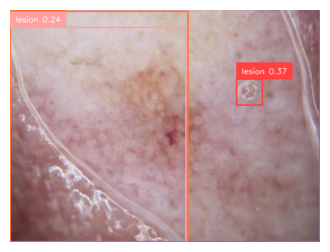

-----------------------
initial detected boxes
tensor([[0.5000, 0.5000, 1.0000, 0.9997],
        [0.7725, 0.3567, 0.0824, 0.1116],
        [0.2842, 0.5396, 0.5679, 0.9209],
        [0.2868, 0.5059, 0.5733, 0.9915]])
-----------------------
initial logits
tensor([0.5165, 0.3689, 0.2440, 0.2518])
-----------------------
initial areas
tensor([0.9997, 0.0092, 0.5230, 0.5685])
-----------------------
initial width_height_ratio
tensor([1.0003, 0.7388, 0.6167, 0.5783])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([[0.2842, 0.5396, 0.5679, 0.9209],
        [0.2868, 0.5059, 0.5733, 0.9915]])
-----------------------
filtered areas
tensor([0.5230, 0.5685])
-----------------------
filtered logits
tensor([0.2440, 0.2518])
-----------------------
filtered phrases
['lesion' 'lesion']
-----------------------
filtered width_height_ratio
tensor([0.6167, 0.5783])
tensor([0.2868, 0.5059, 0.5733, 0.9915])
selected_box_coords
[8.2504749e-02 4.5565634e+00 3.4409177e+02 4.5071722e+02]

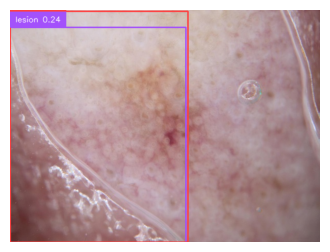

mask_areas
[47862, 49130, 13571]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0026848.jpg'


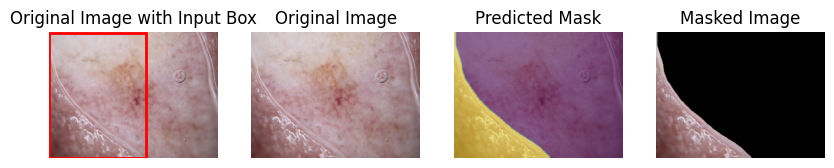

image_path_for_dino
/content/hair_removed/akiec/ISIC_0026857.jpg
image_path_for_sam
/content/original/akiec/ISIC_0026857.jpg
lesion


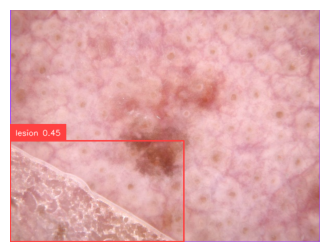

-----------------------
initial detected boxes
tensor([[0.5001, 0.5001, 1.0000, 1.0000],
        [0.2806, 0.7826, 0.5612, 0.4343]])
-----------------------
initial logits
tensor([0.5417, 0.4476])
-----------------------
initial areas
tensor([1.0000, 0.2437])
-----------------------
initial width_height_ratio
tensor([1.0000, 1.2921])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


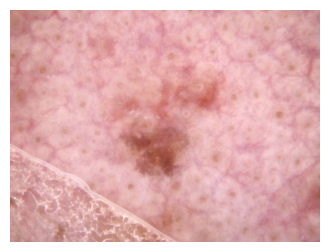

mask_areas
[148011, 112764, 17430]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0026857.jpg'


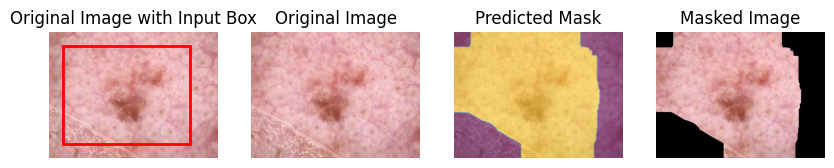

image_path_for_dino
/content/hair_removed/akiec/ISIC_0026927.jpg
image_path_for_sam
/content/original/akiec/ISIC_0026927.jpg
lesion


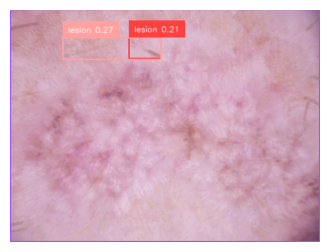

-----------------------
initial detected boxes
tensor([[0.5000, 0.5000, 0.9996, 0.9986],
        [0.4360, 0.1662, 0.1032, 0.0922],
        [0.3291, 0.1702, 0.3175, 0.0939]])
-----------------------
initial logits
tensor([0.6094, 0.2057, 0.2673])
-----------------------
initial areas
tensor([0.9982, 0.0095, 0.0298])
-----------------------
initial width_height_ratio
tensor([1.0010, 1.1199, 3.3810])
indices_to_remove
[0 1 2]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


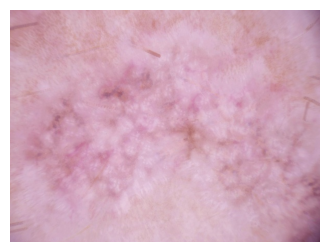

mask_areas
[160951, 122767, 17481]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0026927.jpg'


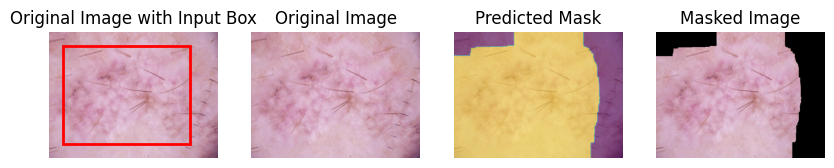

image_path_for_dino
/content/hair_removed/akiec/ISIC_0027294.jpg
image_path_for_sam
/content/original/akiec/ISIC_0027294.jpg
lesion


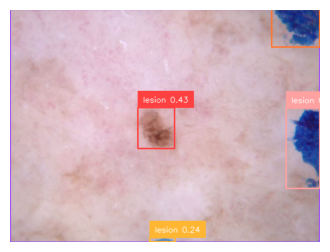

-----------------------
initial detected boxes
tensor([[0.5000, 0.5001, 1.0000, 1.0000],
        [0.4717, 0.5111, 0.1198, 0.1762],
        [0.9457, 0.5985, 0.1085, 0.3451],
        [0.9220, 0.0815, 0.1559, 0.1633],
        [0.4920, 0.9901, 0.0822, 0.0197]])
-----------------------
initial logits
tensor([0.4111, 0.4261, 0.3672, 0.2608, 0.2449])
-----------------------
initial areas
tensor([1.0000, 0.0211, 0.0374, 0.0255, 0.0016])
-----------------------
initial width_height_ratio
tensor([1.0000, 0.6796, 0.3143, 0.9550, 4.1619])
indices_to_remove
[0 2 3 4]
-----------------------
filtered boxes
tensor([[0.4717, 0.5111, 0.1198, 0.1762]])
-----------------------
filtered areas
tensor([0.0211])
-----------------------
filtered logits
tensor([0.4261])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.6796])
tensor([0.4717, 0.5111, 0.1198, 0.1762])
selected_box_coords
[247.06789 190.33379 318.93436 269.64136]


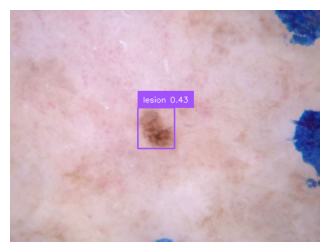

mask_areas
[3360, 3064, 2788]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0027294.jpg'


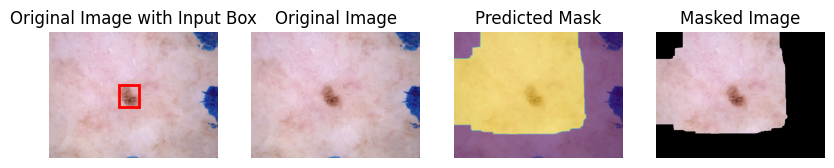

image_path_for_dino
/content/hair_removed/akiec/ISIC_0027896.jpg
image_path_for_sam
/content/original/akiec/ISIC_0027896.jpg
lesion


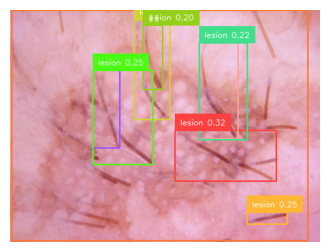

-----------------------
initial detected boxes
tensor([[0.3111, 0.4309, 0.0862, 0.3332],
        [0.6954, 0.6301, 0.3262, 0.2178],
        [0.6730, 0.3506, 0.1242, 0.4110],
        [0.4836, 0.5007, 0.9540, 0.9891],
        [0.8297, 0.8969, 0.1305, 0.0515],
        [0.4582, 0.2607, 0.1141, 0.4278],
        [0.3643, 0.4664, 0.1946, 0.4042],
        [0.4610, 0.2072, 0.0643, 0.2747],
        [0.6879, 0.3526, 0.1545, 0.4150]])
-----------------------
initial logits
tensor([0.3094, 0.3202, 0.3028, 0.3321, 0.2493, 0.2169, 0.2492, 0.2002, 0.2152])
-----------------------
initial areas
tensor([0.0287, 0.0710, 0.0510, 0.9436, 0.0067, 0.0488, 0.0787, 0.0177, 0.0641])
-----------------------
initial width_height_ratio
tensor([0.2586, 1.4978, 0.3022, 0.9645, 2.5320, 0.2667, 0.4815, 0.2342, 0.3723])
indices_to_remove
[3 4 5 6 7 8]
-----------------------
filtered boxes
tensor([[0.3111, 0.4309, 0.0862, 0.3332],
        [0.6954, 0.6301, 0.3262, 0.2178],
        [0.6730, 0.3506, 0.1242, 0.4110]])
-----

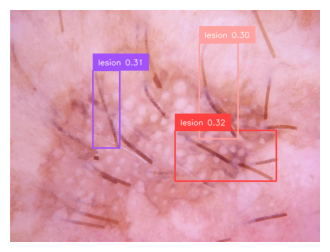

mask_areas
[2511, 1690, 1318]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0027896.jpg'


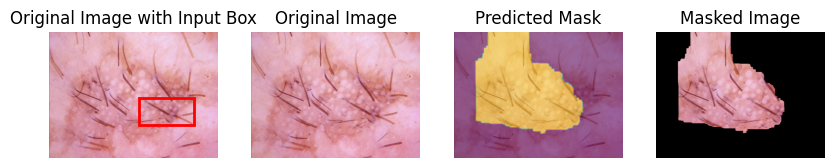

image_path_for_dino
/content/hair_removed/akiec/ISIC_0028499.jpg
image_path_for_sam
/content/original/akiec/ISIC_0028499.jpg
lesion


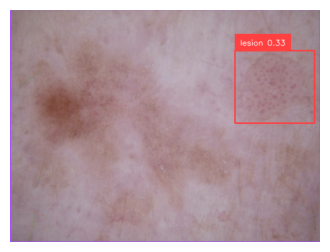

-----------------------
initial detected boxes
tensor([[0.5000, 0.5002, 1.0000, 1.0000],
        [0.8540, 0.3342, 0.2579, 0.3113]])
-----------------------
initial logits
tensor([0.5777, 0.3322])
-----------------------
initial areas
tensor([1.0000, 0.0803])
-----------------------
initial width_height_ratio
tensor([1.0000, 0.8284])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


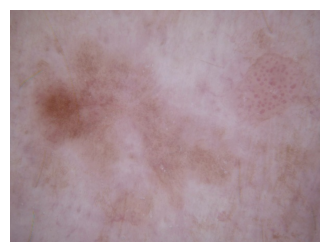

mask_areas
[162898, 96468, 17350]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0028499.jpg'


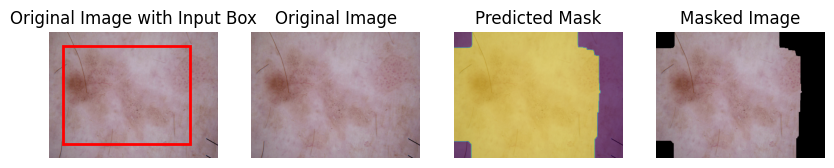

image_path_for_dino
/content/hair_removed/akiec/ISIC_0028393.jpg
image_path_for_sam
/content/original/akiec/ISIC_0028393.jpg
lesion


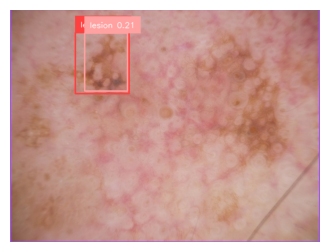

-----------------------
initial detected boxes
tensor([[0.5000, 0.5002, 1.0000, 1.0000],
        [0.2973, 0.2324, 0.1729, 0.2637],
        [0.3099, 0.2275, 0.1385, 0.2506]])
-----------------------
initial logits
tensor([0.6100, 0.2925, 0.2108])
-----------------------
initial areas
tensor([1.0000, 0.0456, 0.0347])
-----------------------
initial width_height_ratio
tensor([1.0000, 0.6556, 0.5528])
indices_to_remove
[0 1 2]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


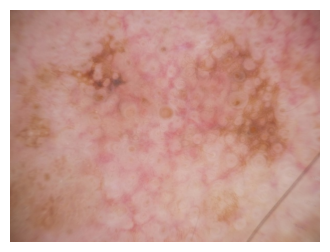

mask_areas
[152992, 106624, 20412]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0028393.jpg'


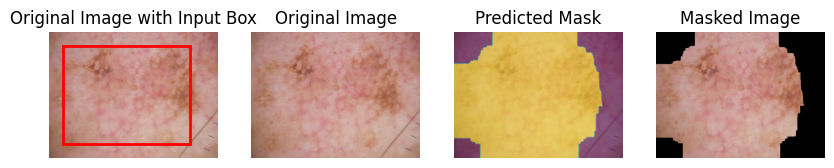

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029360.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029360.jpg
lesion


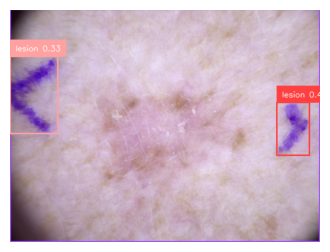

-----------------------
initial detected boxes
tensor([[0.4999, 0.4998, 0.9977, 0.9985],
        [0.9131, 0.5143, 0.1059, 0.2279],
        [0.0780, 0.3687, 0.1540, 0.3298]])
-----------------------
initial logits
tensor([0.5161, 0.4527, 0.3270])
-----------------------
initial areas
tensor([0.9961, 0.0241, 0.0508])
-----------------------
initial width_height_ratio
tensor([0.9992, 0.4646, 0.4670])
indices_to_remove
[0 2]
-----------------------
filtered boxes
tensor([[0.9131, 0.5143, 0.1059, 0.2279]])
-----------------------
filtered areas
tensor([0.0241])
-----------------------
filtered logits
tensor([0.4527])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([0.4646])
tensor([0.9131, 0.5143, 0.1059, 0.2279])
selected_box_coords
[516.07544 180.18735 579.5982  282.72647]


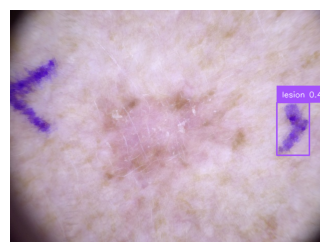

mask_areas
[2557, 2435, 2356]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029360.jpg'


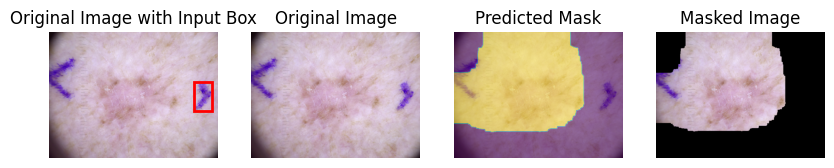

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029582.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029582.jpg
lesion


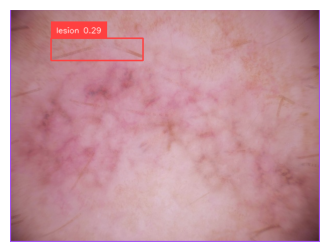

-----------------------
initial detected boxes
tensor([[0.4999, 0.5002, 0.9993, 0.9971],
        [0.2811, 0.1738, 0.2974, 0.0954]])
-----------------------
initial logits
tensor([0.6009, 0.2950])
-----------------------
initial areas
tensor([0.9964, 0.0284])
-----------------------
initial width_height_ratio
tensor([1.0022, 3.1175])
indices_to_remove
[0 1]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


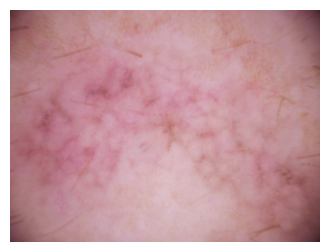

mask_areas
[158802, 122151, 8477]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029582.jpg'


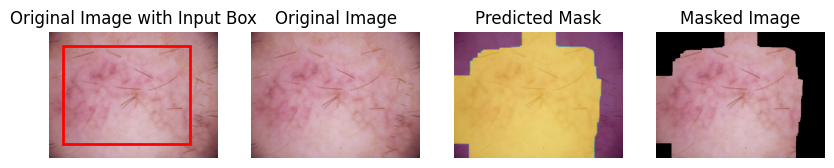

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029573.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029573.jpg
lesion


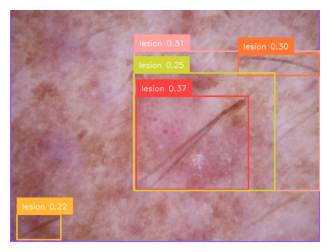

-----------------------
initial detected boxes
tensor([[0.4999, 0.5000, 0.9999, 0.9984],
        [0.5887, 0.5739, 0.3612, 0.3997],
        [0.6997, 0.4801, 0.5983, 0.5996],
        [0.8682, 0.2401, 0.2632, 0.0927],
        [0.0936, 0.9362, 0.1412, 0.1081],
        [0.6265, 0.5270, 0.4548, 0.5035]])
-----------------------
initial logits
tensor([0.3617, 0.3729, 0.3137, 0.2964, 0.2229, 0.2525])
-----------------------
initial areas
tensor([0.9983, 0.1444, 0.3587, 0.0244, 0.0153, 0.2290])
-----------------------
initial width_height_ratio
tensor([1.0015, 0.9036, 0.9977, 2.8407, 1.3064, 0.9032])
indices_to_remove
[0 2 3 4]
-----------------------
filtered boxes
tensor([[0.5887, 0.5739, 0.3612, 0.3997],
        [0.6265, 0.5270, 0.4548, 0.5035]])
-----------------------
filtered areas
tensor([0.1444, 0.2290])
-----------------------
filtered logits
tensor([0.3729, 0.2525])
-----------------------
filtered phrases
['lesion' 'lesion']
-----------------------
filtered width_height_ratio
tensor(

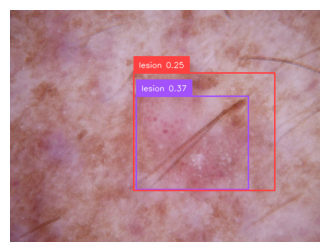

mask_areas
[5930, 4420, 3841]
Masked portion of the image saved as '/content/masked_image_akiec_ISIC_0029573.jpg'


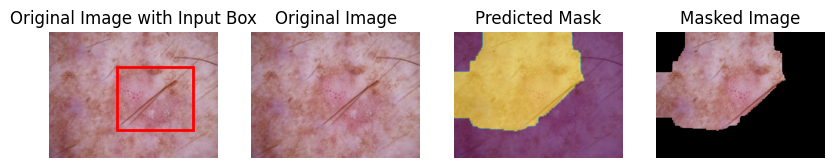

In [243]:
'''
            "bkl/ISIC_0026893.jpg",
            "bkl/ISIC_0025419.jpg",
            "bkl/ISIC_0033466.jpg",
            "bkl/ISIC_0032778.jpg",
            "bkl/ISIC_0032725.jpg",
            "bkl/ISIC_0032842.jpg",
            "bkl/ISIC_0032156.jpg",
            "bkl/ISIC_0032103.jpg",
            "bkl/ISIC_0031449.jpg",
            '''
img_list = [

            "bkl/ISIC_0031485.jpg",
            "akiec/ISIC_0029715.jpg",
            "akiec/ISIC_0029827.jpg",
            "akiec/ISIC_0024511.jpg",
            "akiec/ISIC_0024948.jpg",
            "akiec/ISIC_0025637.jpg",
            "akiec/ISIC_0025811.jpg",
            "akiec/ISIC_0029573.jpg",
            "akiec/ISIC_0030463.jpg",
            "akiec/ISIC_0031918.jpg",
            "akiec/ISIC_0026522.jpg",
            "akiec/ISIC_0026848.jpg",
            "akiec/ISIC_0026857.jpg",
            "akiec/ISIC_0026927.jpg",
            "akiec/ISIC_0027294.jpg",
            "akiec/ISIC_0027896.jpg",
            "akiec/ISIC_0028499.jpg",
            "akiec/ISIC_0028393.jpg",
            "akiec/ISIC_0029360.jpg",
            "akiec/ISIC_0029582.jpg",
            "akiec/ISIC_0029573.jpg"
]

for img in img_list:
  hair_removed_image_path = os.path.join("/content/hair_removed/", img )
  original_image_path = os.path.join("/content/original/", img )
  test(hair_removed_image_path, original_image_path)

In [213]:
image = cv2.imread("/content/original/akiec/ISIC_0029715.jpg")
hair_removed = remove_hair_balanced(image)
cv2.imwrite("/content/hair_removed_image.jpg", hair_removed)

True

image_path_for_dino
/content/hair_removed/akiec/ISIC_0029067.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029067.jpg
lesion


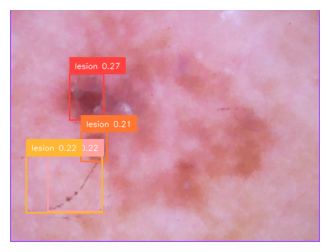

-----------------------
initial detected boxes
tensor([[0.4998, 0.4997, 0.9971, 0.9988],
        [0.2475, 0.3778, 0.1110, 0.1958],
        [0.2095, 0.7493, 0.1751, 0.2366],
        [0.2709, 0.5915, 0.0841, 0.1269],
        [0.1749, 0.7531, 0.2453, 0.2444]])
-----------------------
initial logits
tensor([0.5116, 0.2674, 0.2163, 0.2081, 0.2182])
-----------------------
initial areas
tensor([0.9959, 0.0217, 0.0414, 0.0107, 0.0599])
-----------------------
initial width_height_ratio
tensor([0.9983, 0.5667, 0.7401, 0.6627, 1.0036])
indices_to_remove
[0 1 2 3 4]
-----------------------
filtered boxes
tensor([], size=(0, 4))
-----------------------
filtered areas
tensor([])
-----------------------
filtered logits
tensor([])
-----------------------
filtered phrases
[]
-----------------------
filtered width_height_ratio
tensor([])
selected_box_coords
[ 50  50 500 400]


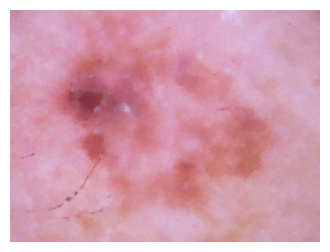

Masked portion of the image saved as '/content/masked_image_ISIC_0031485.jpg'


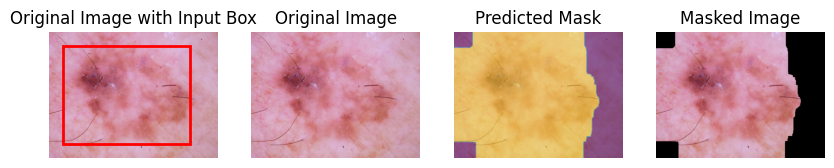

In [206]:
test("/content/hair_removed/akiec/ISIC_0029067.jpg", "/content/original/akiec/ISIC_0029067.jpg")

image_path_for_dino
/content/original/akiec/ISIC_0029067.jpg
image_path_for_sam
/content/original/akiec/ISIC_0029067.jpg
lesion


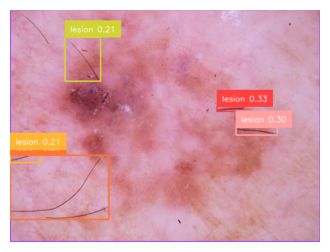

-----------------------
initial detected boxes
tensor([[0.5001, 0.4997, 1.0000, 0.9993],
        [0.7107, 0.4296, 0.0871, 0.0196],
        [0.7961, 0.5251, 0.1327, 0.0334],
        [0.1596, 0.7651, 0.3189, 0.2765],
        [0.0505, 0.6307, 0.1007, 0.0561],
        [0.2352, 0.2150, 0.1154, 0.1899]])
-----------------------
initial logits
tensor([0.3941, 0.3277, 0.2994, 0.2638, 0.2068, 0.2069])
-----------------------
initial areas
tensor([0.9992, 0.0017, 0.0044, 0.0882, 0.0056, 0.0219])
-----------------------
initial width_height_ratio
tensor([1.0007, 4.4432, 3.9697, 1.1533, 1.7944, 0.6076])
indices_to_remove
[0 1 2 4 5]
-----------------------
filtered boxes
tensor([[0.1596, 0.7651, 0.3189, 0.2765]])
-----------------------
filtered areas
tensor([0.0882])
-----------------------
filtered logits
tensor([0.2638])
-----------------------
filtered phrases
['lesion']
-----------------------
filtered width_height_ratio
tensor([1.1533])
tensor([0.1596, 0.7651, 0.3189, 0.2765])
selected_box_c

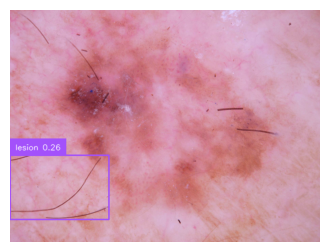

Masked portion of the image saved as '/content/masked_image_ISIC_0031485.jpg'


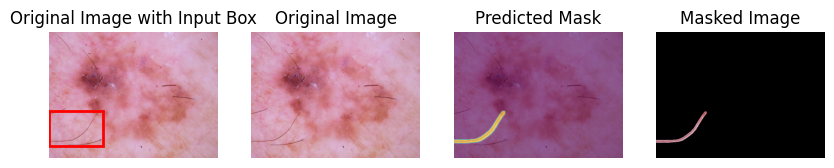

In [204]:
test("/content/original/akiec/ISIC_0029067.jpg", "/content/original/akiec/ISIC_0029067.jpg")

In [244]:
import os

src_dir = "/content/original"
dst_dir = "/content/lesion_extracted"

# List all folders in the source directory
folders = [os.path.relpath(os.path.join(root, d), src_dir) for root, dirs, files in os.walk(src_dir) for d in dirs]

print("Folders in source directory:")
for folder in folders:
    # Create the same folder in the destination directory
    os.makedirs(os.path.join(dst_dir, folder), exist_ok=True)
    print(f"destination folder {folder} created")
print(f"\nFolder structure created in {dst_dir}")

def extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, processed_directory):
    i=0
    for filename in os.listdir(original_image_directory):
        i+=1
        if filename.endswith((".png", ".jpg", ".jpeg", ".gif")):
            hair_removed_image_path = os.path.join(hair_removed_image_directory, filename)
            original_image_path = os.path.join(original_image_directory, filename)
            extract_lesion_from_image_and_save(hair_removed_image_path, original_image_path, f"{processed_directory}/{filename}", show_plots=False, print_logs=False)
            if i%50==0:
              print("image count: ",i)


Folders in source directory:
destination folder bcc created
destination folder bkl created
destination folder mel created
destination folder nv created
destination folder akiec created
destination folder df created
destination folder vasc created

Folder structure created in /content/lesion_extracted


In [245]:
original_image_directory = "/content/original/akiec"
hair_removed_image_directory = "/content/hair_removed/akiec"
dst_dir = "/content/lesion_extracted/akiec"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
image count:  150
image count:  200
image count:  250
image count:  300


In [246]:
original_image_directory = "/content/original/bcc"
hair_removed_image_directory = "/content/hair_removed/bcc"
dst_dir = "/content/lesion_extracted/bcc"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
image count:  150
image count:  200
image count:  250
image count:  300
image count:  350
image count:  400
image count:  450
image count:  500


In [247]:
original_image_directory = "/content/original/bkl"
hair_removed_image_directory = "/content/hair_removed/bkl"
dst_dir = "/content/lesion_extracted/bkl"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
image count:  150
image count:  200
image count:  250
image count:  300
image count:  350
image count:  400
image count:  450
image count:  500
image count:  550
image count:  600
image count:  650
image count:  700
image count:  750
image count:  800
image count:  850
image count:  900
image count:  950
image count:  1000
image count:  1050


In [248]:
original_image_directory = "/content/original/df"
hair_removed_image_directory = "/content/hair_removed/df"
dst_dir = "/content/lesion_extracted/df"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100


In [249]:
original_image_directory = "/content/original/mel"
hair_removed_image_directory = "/content/hair_removed/mel"
dst_dir = "/content/lesion_extracted/mel"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
image count:  150
image count:  200
image count:  250
image count:  300
image count:  350
image count:  400
image count:  450
image count:  500
image count:  550
image count:  600
image count:  650
image count:  700
image count:  750
image count:  800
image count:  850
image count:  900
image count:  950
image count:  1000
image count:  1050
image count:  1100


In [250]:
original_image_directory = "/content/original/nv"
hair_removed_image_directory = "/content/hair_removed/nv"
dst_dir = "/content/lesion_extracted/nv"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
image count:  150
image count:  200
image count:  250
image count:  300
image count:  350
image count:  400
image count:  450
image count:  500
image count:  550
image count:  600
image count:  650
image count:  700
image count:  750
image count:  800
image count:  850
image count:  900
image count:  950
image count:  1000
image count:  1050
image count:  1100
image count:  1150
image count:  1200
image count:  1250
image count:  1300
image count:  1350
image count:  1400
image count:  1450
image count:  1500
image count:  1550
image count:  1600
image count:  1650
image count:  1700
image count:  1750
image count:  1800
image count:  1850
image count:  1900
image count:  1950
image count:  2000
image count:  2050
image count:  2100
image count:  2150
image count:  2200
image count:  2250
image count:  2300
image count:  2350
image count:  2400
image count:  2450
image count:  2500
image count:  2550
image count:  2600
image count:  2650
image count: 

In [251]:
original_image_directory = "/content/original/vasc"
hair_removed_image_directory = "/content/hair_removed/vasc"
dst_dir = "/content/lesion_extracted/vasc"
extract_lesions_from_directory(hair_removed_image_directory, original_image_directory, dst_dir)

image count:  50
image count:  100
